In [1]:
#I am using my Python 3 11 scanorama env
! python --version

Python 3.11.9


In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import cm, colors
from matplotlib.lines import Line2D
from matplotlib.collections import PatchCollection
from matplotlib import patches

import seaborn as sns

import scipy.sparse

import scipy.sparse
from scipy.stats import zscore
from scipy.ndimage import zoom, gaussian_filter

from scipy.stats import pearsonr, spearmanr

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from shapely.geometry import Polygon, MultiPolygon, Point

from scipy.cluster.hierarchy import linkage, leaves_list

from adjustText import adjust_text

import warnings

import geopandas as gpd

from scipy.stats import zscore
from scipy.signal import savgol_filter  

import geopandas as gpd

import scanpy as sc

import anndata as an
import scanorama

from pathlib import Path

import squidpy as sq

import os
import warnings

from shapely.geometry import Polygon, MultiPolygon, Point
from shapely.affinity import affine_transform

import matplotlib.patches as patches
from matplotlib.collections import PatchCollection
from shapely.geometry import Polygon, MultiPolygon
from scipy.ndimage import rotate

import math

import tifffile

from numpy.linalg import inv
from skimage.transform import AffineTransform, warp

from skimage import exposure

sc.logging.print_versions()

-----
anndata     0.10.7
scanpy      1.10.0
-----
PIL                         10.3.0
adjustText                  1.3.0
annoy                       NA
anyio                       NA
asciitree                   NA
asttokens                   NA
attr                        23.1.0
attrs                       23.1.0
babel                       2.11.0
brotli                      1.0.9
certifi                     2025.01.31
cffi                        1.16.0
charset_normalizer          2.0.4
cloudpickle                 3.0.0
colorama                    0.4.6
comm                        0.2.1
cycler                      0.12.1
cython_runtime              NA
dask                        2024.5.0
dask_expr                   1.1.0
dask_image                  2023.08.1
datashader                  0.16.1
datatree                    0.0.14
dateutil                    2.8.2
debugpy                     1.6.7
decorator                   5.1.1
defusedxml                  0.7.1
docrep                     

## read in adata_spatial 

In [5]:
# Define the path to the .h5ad file
file_path = 'leidenclustering/VRT_A2a_A2b_leiden_200genes_res1_indexed.h5ad'

# Read the file into an AnnData object
adata_spatial = sc.read_h5ad(file_path)

# Print the object to confirm it has been loaded correctly
print(adata_spatial)

AnnData object with n_obs × n_vars = 50731 × 200
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'dataset', 'clusters'
    uns: 'clusters', 'clusters_colors', 'hvg', 'neighbors', 'umap'
    obsm: 'X_scanorama', 'X_umap', 'blank_genes', 'spatial'
    obsp: 'connectivities', 'distances'


### read in cell cluster assignments and save to dataframe 

In [6]:
# Extract cell identifiers and cluster assignments for later uses 
cell_cluster_assignments = adata_spatial.obs[['clusters']]

# Optionally reset the index to get the cell IDs as a column
cell_cluster_assignments.reset_index(inplace=True)

# Rename columns for clarity
cell_cluster_assignments.columns = ['cell_id', 'cluster']

# Save to a DataFrame
df_cell_cluster_assignments = pd.DataFrame(cell_cluster_assignments)

# Ensure that 'cell_id' is treated as a string column
df_cell_cluster_assignments['cell_id'] = df_cell_cluster_assignments['cell_id'].astype(str)

# Split the 'cell_id' column by '-' and expand into two columns
split_columns = df_cell_cluster_assignments['cell_id'].str.split('-', expand=True)

# Assign the first part to 'cell_id' and the second part to 'sample'
df_cell_cluster_assignments['cell_id'] = split_columns[0]
df_cell_cluster_assignments['sample'] = split_columns[1]

df_cell_cluster_assignments.set_index('cell_id', inplace=True)

### Analysing Domain & Cell Number in WT LDR + LP Spikes 

In [8]:
#extracting the cells in the inflorescence only, group created in MERSCOPE Visualiser tool 
cellsinspike = pd.read_csv('spikeletridge_leafridge_analysis/cell_lists/VGN1e1_allcellsinspike.csv')
cellsinspike.rename(columns={cellsinspike.columns[0]: 'cell_id'}, inplace=True)
cellsinspike['cell_id'] = cellsinspike['cell_id'].astype(str)
cellsinspike_VGN1e1 = cellsinspike.copy()

#filter my dataframe so that only cells in the spike are included
cell_id_list = cellsinspike_VGN1e1['cell_id'].tolist()
# Filter combined_df to only include rows where the index is in the cell_id_list
cluster_VGN1e1 = df_cell_cluster_assignments[df_cell_cluster_assignments.index.isin(cell_id_list)]
unique_clusters_count = cluster_VGN1e1['cluster'].nunique()
print("Number of unique clusters in LDR inflorescence:", unique_clusters_count)

Number of unique clusters in LDR inflorescence: 10


In [8]:
# Calculate the total cell count per cluster, excluding clusters with 0 cells
cluster_counts = cluster_VGN1e1['cluster'].value_counts()
cluster_counts = cluster_counts[cluster_counts > 0]  # Filter out clusters with 0 cells

# Calculate cumulative percentages
cumulative_percentage = cluster_counts.cumsum() / cluster_counts.sum()

# Print cumulative percentages for the top N domains
for i in range(1, len(cumulative_percentage) + 1):
    percentage = cumulative_percentage.iloc[i - 1] * 100
    print(f"The top {i} domains account for {percentage:.2f}% of cells.")


The top 1 domains account for 34.90% of cells.
The top 2 domains account for 65.77% of cells.
The top 3 domains account for 81.06% of cells.
The top 4 domains account for 94.81% of cells.
The top 5 domains account for 98.17% of cells.
The top 6 domains account for 98.75% of cells.
The top 7 domains account for 99.23% of cells.
The top 8 domains account for 99.71% of cells.
The top 9 domains account for 99.90% of cells.
The top 10 domains account for 100.00% of cells.


In [11]:
#filter my dataframe so that only cells in the spike are included
cellsinspike = pd.read_csv('spikeletridge_leafridge_analysis/cell_lists/VGN1b6_allcellsinspike.csv')
cellsinspike.rename(columns={cellsinspike.columns[0]: 'cell_id'}, inplace=True)
cellsinspike['cell_id'] = cellsinspike['cell_id'].astype(str)
cellsinspike_VGN1b6 = cellsinspike.copy()

#filter my dataframe so that only cells in the spike are included
cell_id_list = cellsinspike_VGN1b6['cell_id'].tolist()
# Filter combined_df to only include rows where the index is in the cell_id_list
cluster_VGN1b6 = df_cell_cluster_assignments[df_cell_cluster_assignments.index.isin(cell_id_list)]
unique_clusters_count = cluster_VGN1b6['cluster'].nunique()
print("Number of unique clusters in LP inflorescence :", unique_clusters_count)

Number of unique clusters in LP inflorescence : 14


In [12]:
# Calculate the total cell count per cluster, excluding clusters with 0 cells
cluster_counts = cluster_VGN1b6['cluster'].value_counts()
cluster_counts = cluster_counts[cluster_counts > 0]  # Filter out clusters with 0 cells

# Calculate cumulative percentages
cumulative_percentage = cluster_counts.cumsum() / cluster_counts.sum()

# Print cumulative percentages for the top N domains
for i in range(1, len(cumulative_percentage) + 1):
    percentage = cumulative_percentage.iloc[i - 1] * 100
    print(f"The top {i} domains account for {percentage:.2f}% of cells.")


The top 1 domains account for 31.13% of cells.
The top 2 domains account for 54.58% of cells.
The top 3 domains account for 67.66% of cells.
The top 4 domains account for 76.46% of cells.
The top 5 domains account for 82.52% of cells.
The top 6 domains account for 87.40% of cells.
The top 7 domains account for 90.96% of cells.
The top 8 domains account for 94.07% of cells.
The top 9 domains account for 96.45% of cells.
The top 10 domains account for 98.79% of cells.
The top 11 domains account for 99.27% of cells.
The top 12 domains account for 99.64% of cells.
The top 13 domains account for 99.88% of cells.
The top 14 domains account for 100.00% of cells.


### how many cells at leaf ridge base of LDR sample VGN1e1 compared to leaf ridge apex? 

In [15]:
cellgroups = pd.read_csv('spikeletridge_leafridge_analysis/cell_lists/VGN1e_region1_cell_categories.csv', header=0, index_col=0)
cellgroups = cellgroups[['Custom cell groups']].copy()

# Count occurrences of each 'LR' group in the 'Custom cell groups' column
lr1_count = cellgroups['Custom cell groups'].value_counts().get('LR1', 0)
print("Number of entries under 'LR1':", lr1_count)

lr2_count = cellgroups['Custom cell groups'].value_counts().get('LR2', 0)
print("Number of entries under 'LR2':", lr2_count)

lr3_count = cellgroups['Custom cell groups'].value_counts().get('LR3', 0)
print("Number of entries under 'LR3':", lr3_count)

lr4_count = cellgroups['Custom cell groups'].value_counts().get('LR4', 0)
print("Number of entries under 'LR4':", lr4_count)

# Store the counts in a list
lr_counts = [lr1_count, lr2_count, lr3_count, lr4_count]

# Calculate the average
average_count = sum(lr_counts) / len(lr_counts)

# Calculate the standard deviation
variance = sum((x - average_count) ** 2 for x in lr_counts) / len(lr_counts)
std_dev = math.sqrt(variance)

# Format the result
print(f"Averaging {average_count:.2f} ± {std_dev:.2f} cells per section.")

Number of entries under 'LR1': 58
Number of entries under 'LR2': 32
Number of entries under 'LR3': 16
Number of entries under 'LR4': 24
Averaging 32.50 ± 15.77 cells per section.


In [12]:
# Count occurrences of each 'LR' group in the 'Custom cell groups' column
lr8_count = cellgroups['Custom cell groups'].value_counts().get('LR8', 0)
print("Number of entries under 'LR8':", lr8_count)

lr9_count = cellgroups['Custom cell groups'].value_counts().get('LR9', 0)
print("Number of entries under 'LR9':", lr9_count)

lr10_count = cellgroups['Custom cell groups'].value_counts().get('LR10', 0)
print("Number of entries under 'LR10':", lr10_count)

lr11_count = cellgroups['Custom cell groups'].value_counts().get('LR11', 0)
print("Number of entries under 'LR11':", lr11_count)

# Store the counts in a list
lr_counts = [lr8_count, lr9_count, lr10_count, lr11_count]

# Calculate the average
average_count = sum(lr_counts) / len(lr_counts)

# Calculate the standard deviation
variance = sum((x - average_count) ** 2 for x in lr_counts) / len(lr_counts)
std_dev = math.sqrt(variance)

# Format the result
print(f"Averaging {average_count:.2f} ± {std_dev:.2f} cells per section.")


Number of entries under 'LR8': 15
Number of entries under 'LR9': 12
Number of entries under 'LR10': 12
Number of entries under 'LR11': 11
Averaging 12.50 ± 1.50 cells per section.


# Performing PCA analysis on SRs and LRs 

In [13]:
# reading in gene name annotations for later 
file_path = 'GenePanel/file_records/annotated_names_12_24.csv'
annotation = pd.read_csv(file_path, header = 0, index_col=0)

First I will extract normalised expression values, and average them within each leaf ridge or spikelet ridge group 
</p> (Supplementary File 14)

In [14]:
#Read in the cleaned/filtered adata objects for my samples
# Define the filenames of the saved AnnData objects
adata_filenames = {
    "adata_VGN1e1": "qc/adata_VGN1e1_clean.h5ad"
}

# Initialize a dictionary to store the loaded AnnData objects
loaded_adata_objects = {}

# Load each file and store it in the dictionary
for name, filename in adata_filenames.items():
    loaded_adata_objects[name] = sc.read_h5ad(filename)
    print(f"Loaded {name} from {filename}")

# Access the loaded AnnData objects
adata_VGN1e1 = loaded_adata_objects["adata_VGN1e1"]

Loaded adata_VGN1e1 from qc/adata_VGN1e1_clean.h5ad


In [16]:
# take the normalised expression score adata_VGN1e1
if isinstance(adata_VGN1e1.X, scipy.sparse.spmatrix):
    X_dense = adata_VGN1e1.X.toarray()
else:
    X_dense = adata_VGN1e1.X

    # Create gene expression matrix dataframe
cell_names = adata_VGN1e1.obs_names
gene_names = adata_VGN1e1.var_names
gene_expression_matrix = pd.DataFrame(data=X_dense, index=cell_names, columns=gene_names)

#merge the cell groups and the gene expression matrix 
#Step 1: make sure the index are both strings
gene_expression_matrix.index = gene_expression_matrix.index.astype(str)
cellgroups.index = cellgroups.index.astype(str)

# Step 2: Filter gene_expression_matrix to only include rows present in cellgroups
filtered_gene_expression = gene_expression_matrix[gene_expression_matrix.index.isin(cellgroups.index)]

# Step 3: Combine the two dataframes (matching by index)
combined_df = filtered_gene_expression.join(cellgroups, how='inner')

#Take the average expression score, grouped by the cell groups (LRs and SRs) 
average_gene_expression_per_group = combined_df.groupby('Custom cell groups').mean()

#Filter the gene columns so that genes must have at least one expressions score above 0.30 
filtered_average_gene_expression_per_group = average_gene_expression_per_group.loc[:, (average_gene_expression_per_group > 0.30).any()] #

#saving as supplementary table
filtered_average_gene_expression_per_group.to_csv("spikeletridge_leafridge_analysis/Averaged_NormalisedCountsperCell_SRLRgroups.csv", index=True)

filtered_average_gene_expression_per_group

,TraesCS1A02G306300,TraesCS6A02G110100,TraesCS4D02G017800,TraesCS5A02G401800,TraesCS6A02G335900,TraesCS5B02G246700,TraesCS4B02G064000,TraesCS5B02G396600,TraesCS2A02G174300,TraesCS3D02G284200,...,TraesCS7A02G165600,TraesCS7A02G292900,TraesCS2B02G419200,TraesCS6A02G373500,TraesCS2B02G260800,TraesCS1B02G283900,TraesCS6A02G213700,TraesCS2A02G323500,TraesCS2B02G274200,TraesCS1B02G042200
Custom cell groups,,,,,,,,,,,,,,,,,,,,,
LR1,0.592195,0.312819,0.279014,0.068456,1.158507,0.453646,0.612996,0.643798,0.779635,0.102024,...,0.559794,0.464847,0.070222,0.458490,0.818654,0.333066,0.156476,0.295254,0.510172,0.310218
LR10,0.166783,0.116201,0.078862,0.906650,1.153218,0.344580,0.421055,0.231502,0.404571,0.990903,...,0.050376,0.241367,0.226791,0.258849,0.965346,0.323857,0.050376,0.089797,0.554862,0.220196
LR11,0.684832,0.273548,0.195358,0.593503,1.585243,0.406452,0.264138,0.634151,0.665057,1.176608,...,0.000000,0.332223,0.117457,0.192981,1.054529,0.330327,0.097639,0.394213,0.407155,0.477761
LR12,0.600684,0.128895,0.000000,0.710492,1.236984,0.299100,0.464234,0.296808,0.589380,1.459936,...,0.081294,0.395374,0.251813,0.290275,1.173451,0.300095,0.114797,0.375703,0.638848,0.234809
LR13,0.360574,0.389003,0.512968,0.841780,1.077243,0.437985,0.221659,0.449723,0.523461,1.443846,...,0.046919,0.375277,0.076956,0.366786,1.291216,0.471330,0.089525,0.351535,0.505796,0.496151
LR2,0.586304,0.261049,0.203035,0.036374,1.514485,0.472151,0.370508,0.798039,0.880551,0.207380,...,0.513900,0.420392,0.041590,0.562996,1.259274,0.491463,0.185636,0.369325,0.514158,0.184136
LR3,0.465635,0.170759,0.419600,0.044473,1.276095,0.581547,0.314242,0.460979,1.026664,0.408424,...,0.353437,0.490555,0.048394,0.595601,1.121210,0.230566,0.183697,0.464794,0.289716,0.292080
LR4,0.636107,0.206557,0.304616,0.312261,1.240007,0.514632,0.201142,0.616338,0.912581,0.452769,...,0.210910,0.486442,0.094556,0.545327,0.631140,0.240997,0.097232,0.256507,0.538351,0.336128
LR5,0.467356,0.537221,0.268395,0.299504,1.012439,0.164420,0.238765,0.400791,0.926303,0.745252,...,0.130204,0.248313,0.128408,0.727289,0.628895,0.351412,0.229150,0.509813,0.197020,0.172071


### creating PCA plot for leaf ridges only 

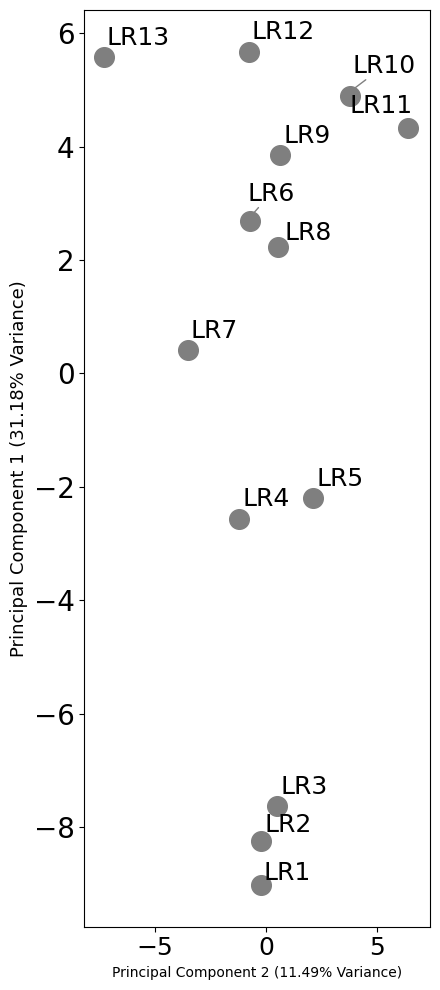

In [17]:
plt.style.use('default')

# exclude spiklet ridge groups 'SR' from the dataframe
filtered_data = filtered_average_gene_expression_per_group[~(
    filtered_average_gene_expression_per_group.index.str.startswith('SR'))]

# Step 1: Standardize the filtered data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(filtered_data)

# Step 2: Perform PCA (reduce to 2 components for visualization)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Step 3: Retrieve explained variance for PC1 and PC2
explained_variance = pca.explained_variance_ratio_

# Step 4: Convert PCA result to a dataframe for easier plotting

# Invert PC1 and PC2 values
pca_result[:, 0] *= -1  # Invert PC1
pca_result[:, 1] *= -1  # Invert PC2

pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'], index=filtered_data.index)

# Step 5: Plot the PCA results and add explained variance to axis labels
plt.figure(figsize=(4.5, 10))

# Scatter plot with custom color for 'SR' categories
texts = []  # For storing text objects for adjustText
for i, cell_group in enumerate(pca_df.index):
    plt.scatter(pca_df.iloc[i, 1], pca_df.iloc[i, 0], color='#7F7F7F', s=200)
    # Adjust the offset for text labels
    texts.append(plt.text(pca_df.iloc[i, 1] + 0.10, pca_df.iloc[i, 0] + 0.10, cell_group, fontsize=18)) 

# Adjust text positions to avoid overlap
adjust_text(texts, only_move={'points': 'y', 'texts': 'y'}, arrowprops=dict(arrowstyle='-', color='gray'))

plt.ylabel(f'Principal Component 1 ({explained_variance[0] * 100:.2f}% Variance)', fontsize=13)
plt.xlabel(f'Principal Component 2 ({explained_variance[1] * 100:.2f}% Variance)', fontsize=10)

plt.tick_params(axis='x', labelsize=18)
plt.tick_params(axis='y', labelsize=20)

# Extend the x-axis slightly
x_min, x_max = plt.xlim()
plt.xlim(x_min - 0.2, x_max + 0.3)

# Add grid lines (optional)
plt.grid(False)


# Show the plot
plt.tight_layout()
plt.savefig('spikeletridge_leafridge_analysis/figures/VGN1e1_LRPCA.svg', dpi=700, bbox_inches='tight', format='svg', transparent=True)
plt.show()

I want to calculate the PC loadings, to ask which genes are contributing most to PC1 

In [18]:
#save the loadings for later use
loadings_LR = pd.DataFrame(pca.components_.T,
                        columns=['PC1_loading_LR', 'PC2_loading_LR'],
                        index=filtered_data.columns)  # genes as index
loadings_LR = loadings_LR.reset_index()
loadings_LR.columns = ['gene_id', 'PC1_loading_LR', 'PC2_loading_LR']

In [19]:
loadings = pd.DataFrame(pca.components_.T,
                        columns=['PC1', 'PC2'],
                        index=filtered_data.columns)  # genes as index
top_PC1_genes = loadings['PC1'].sort_values(ascending=False).head(10)
top_PC1_genes_df = top_PC1_genes.reset_index()
top_PC1_genes_df.columns = ['gene_id', 'PC1_loading_LR']

merged_top_PC1_genes = top_PC1_genes_df.merge(annotation, on='gene_id', how='left')
merged_top_PC1_genes

,gene_id,PC1_loading_LR,annotated_name
0,TraesCS6A02G287300,0.179266,TraesCS6A02G287300_OsLEC1
1,TraesCS5A02G473800,0.179107,TraesCS5A02G473800_AP2-5
2,TraesCS7A02G165600,0.176973,TraesCS7A02G165600_OsGRF2
3,TraesCS4A02G191300,0.176115,TraesCS4A02G191300_OsSCR2
4,TraesCS6B02G144000,0.173345,TraesCS6B02G144000_OseIF-4A
5,TraesCS1D02G343400,0.171952,TraesCS1D02G343400_TaPEL3
6,TraesCS5A02G265900,0.170692,TraesCS5A02G265900_TaSPL17
7,TraesCS7A02G308400,0.169414,TraesCS7A02G308400_OsROC7t
8,TraesCS3D02G357400,0.158528,TraesCS3D02G357400_OsqSH1
9,TraesCS2D02G256600,0.151093,TraesCS2D02G256600_OsPLT8


In [20]:
loadings = pd.DataFrame(pca.components_.T,
                        columns=['PC1', 'PC2'],
                        index=filtered_data.columns)  # genes as index
bottom_PC1_genes = loadings['PC1'].sort_values().head(10)
bottom_PC1_genes_df = bottom_PC1_genes.reset_index()
bottom_PC1_genes_df.columns = ['gene_id', 'PC1_loading']

merged_bottom_PC1_genes = bottom_PC1_genes_df.merge(annotation, on='gene_id', how='left')
merged_bottom_PC1_genes

,gene_id,PC1_loading,annotated_name
0,TraesCS5A02G230500,-0.182547,TraesCS5A02G230500
1,TraesCS1D02G162600,-0.181412,TraesCS1D02G162600_TaYABBY1D
2,TraesCS5A02G401800,-0.178887,TraesCS5A02G401800_OsDof15
3,TraesCS3D02G284200,-0.171665,TraesCS3D02G284200_OsMADS32
4,TraesCS2B02G464200,-0.159702,TraesCS2B02G464200_TaLFY2
5,TraesCS4D02G245300,-0.156351,TraesCS4D02G245300_TaYABBY4D
6,TraesCS5B02G507300,-0.151733,TraesCS5B02G507300
7,TraesCS7D02G191600,-0.143668,TraesCS7D02G191600_TaPIN1
8,TraesCS1A02G199600,-0.137848,TraesCS1A02G199600_OsMADS56
9,TraesCS2B02G419200,-0.127746,TraesCS2B02G419200_OsROC4


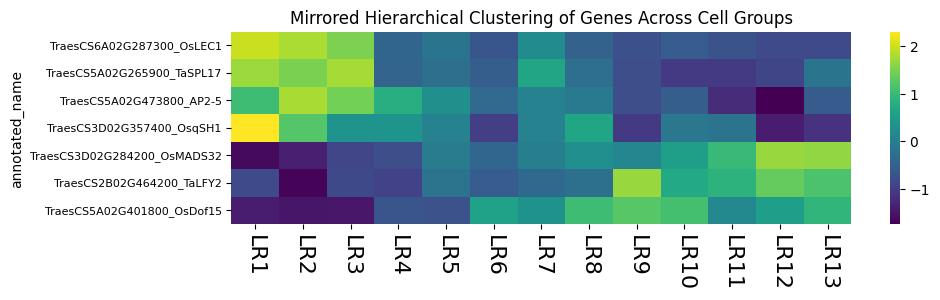

In [21]:
plt.figure(figsize=(10, 2.5))


# Define the categories in the desired order (cell groups)
categories = ['LR1', 'LR2', 'LR3', 'LR4', 'LR5', 'LR6', 'LR7', 'LR8', 'LR9', 
 'LR10', 'LR11', 'LR12', 'LR13']

# Define the genes to plot
genes_to_plot = ['TraesCS6A02G287300', #LEC1
                 'TraesCS5A02G265900', #SPL17 
                 'TraesCS5A02G473800', #AP2-5
                 'TraesCS3D02G357400', #RIL1
                 'TraesCS3D02G284200', #MADS32
                 'TraesCS2B02G464200', # LFY
                 'TraesCS5A02G401800', #DOF15

                 ]

# Filter the DataFrame to select only the desired categories and genes
filtered_data = filtered_average_gene_expression_per_group.loc[categories, genes_to_plot]

# Transpose for heatmap format (genes on y-axis, cell groups on x-axis)
heatmap_data = filtered_data.T
heatmap_data_zscore = heatmap_data.apply(zscore, axis=1)

# Annotate data
heatmap_data_zscore_Annotated = pd.merge(heatmap_data_zscore, annotation, left_index=True, right_index=True, how='left')
heatmap_data_zscore_Annotated.set_index('annotated_name', inplace=True)

# Perform hierarchical clustering on rows and get reordered indices
#row_linkage = linkage(heatmap_data_zscore_Annotated, method='average', metric='euclidean')
#row_order = leaves_list(row_linkage)[::-1]  # Reverse the clustering order

# Reorder rows based on the reversed clustering
#heatmap_data_reordered = heatmap_data_zscore_Annotated.iloc[row_order]

# Plot using the reordered data
ax = sns.heatmap(heatmap_data_zscore_Annotated, cmap='viridis', linewidths=0.0)
plt.title('Mirrored Hierarchical Clustering of Genes Across Cell Groups')

# Set the row label font size
ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)  # Adjust fontsize as needed
ax.set_xticklabels(ax.get_xticklabels(), rotation=270, ha='center', fontsize=10)  # Increase fontsize as needed

plt.tick_params(axis='x', labelsize=16)


plt.savefig('spikeletridge_leafridge_analysis/figures/VGN1e1_LR_heatmap.svg', dpi=700, bbox_inches='tight', format='svg', transparent=True)
plt.show()


I want to correlate the position of the LRs to the PC1 score. 

I am using Spearmann's. 

Pearson's assumed both variables are continuous and linearly related. I would only be ok to use in the case that the ridges are a proxy for distance (a continuous variable) and in equally spaced intervals. 

Spearman's doesn't assume linearity or normality, so this would be useful if ridge position reflects a meaningful order but not necessarily equal spacing. 

Correlation between ridge position and PC1: r = 0.973, p = 2.6191e-08


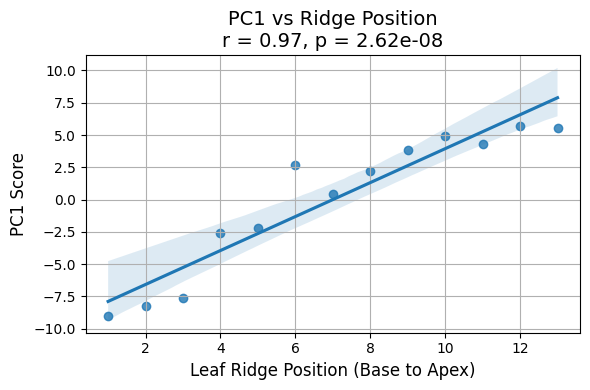

In [22]:
# Step 1: Reset index to move 'Custom cell groups' into a column
pca_df = pca_df.reset_index()

# Step 2: Extract the numeric ridge number from values like 'LR1', 'LR2', etc.
pca_df['ridge_position'] = pca_df['Custom cell groups'].str.extract(r'LR(\d+)').astype(float)


# Compute Spearman correlation between ridge position and PC1
corr_coef, p_value = spearmanr(pca_df['ridge_position'], pca_df['PC1'])

print(f"Correlation between ridge position and PC1: r = {corr_coef:.3f}, p = {p_value:.4e}")


plt.figure(figsize=(6, 4))
sns.regplot(x='ridge_position', y='PC1', data=pca_df)
plt.xlabel('Leaf Ridge Position (Base to Apex)', fontsize=12)
plt.ylabel('PC1 Score', fontsize=12)
plt.title(f'PC1 vs Ridge Position\nr = {corr_coef:.2f}, p = {p_value:.2e}', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()

### creating PCA plot for spikelet ridges only 

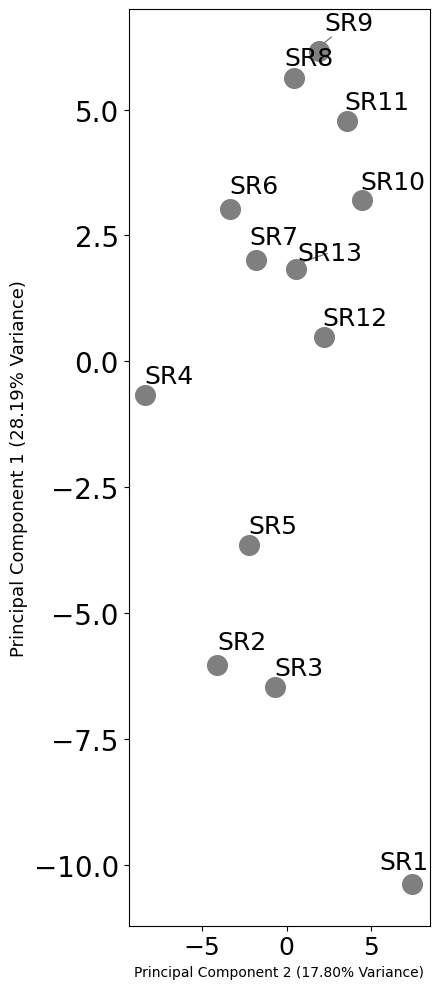

In [23]:
plt.style.use('default')

# exclude spiklet ridge groups 'SR' from the dataframe
filtered_data = filtered_average_gene_expression_per_group[~(
    filtered_average_gene_expression_per_group.index.str.startswith('LR'))]

# Step 1: Standardize the filtered data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(filtered_data)

# Step 2: Perform PCA (reduce to 2 components for visualization)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Step 3: Retrieve explained variance for PC1 and PC2
explained_variance = pca.explained_variance_ratio_

# Step 4: Convert PCA result to a dataframe for easier plotting

# Invert PC1 and PC2 values
pca_result[:, 0] *= -1  # Invert PC1
pca_result[:, 1] *= -1  # Invert PC2

pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'], index=filtered_data.index)

# Step 5: Plot the PCA results and add explained variance to axis labels
plt.figure(figsize=(4.5, 10))

# Scatter plot with custom color for 'SR' categories
texts = []  # For storing text objects for adjustText
for i, cell_group in enumerate(pca_df.index):
    plt.scatter(pca_df.iloc[i, 1], pca_df.iloc[i, 0], color='#7F7F7F', s=200)
    # Adjust the offset for text labels
    texts.append(plt.text(pca_df.iloc[i, 1] + 0.10, pca_df.iloc[i, 0] + 0.10, cell_group, fontsize=18)) 

# Adjust text positions to avoid overlap
adjust_text(texts, only_move={'points': 'y', 'texts': 'y'}, arrowprops=dict(arrowstyle='-', color='gray'))

plt.ylabel(f'Principal Component 1 ({explained_variance[0] * 100:.2f}% Variance)', fontsize=13)
plt.xlabel(f'Principal Component 2 ({explained_variance[1] * 100:.2f}% Variance)', fontsize=10)

plt.tick_params(axis='x', labelsize=18)
plt.tick_params(axis='y', labelsize=20)

# Extend the x-axis slightly
x_min, x_max = plt.xlim()
plt.xlim(x_min - 0.2, x_max + 0.3)

# Add grid lines (optional)
plt.grid(False)


# Show the plot
plt.tight_layout()
plt.savefig('spikeletridge_leafridge_analysis/figures/VGN1e1_SRPCA.svg', dpi=700, bbox_inches='tight', format='svg', transparent=True)
plt.show()

In [24]:
#save the loadings for later use
loadings_SR = pd.DataFrame(pca.components_.T,
                        columns=['PC1_loading_SR', 'PC2_loading_SR'],
                        index=filtered_data.columns)  # genes as index

#save the loadings for later use
loadings_SR = pd.DataFrame(pca.components_.T,
                        columns=['PC1_loading_SR', 'PC2_loading_SR'],
                        index=filtered_data.columns)  # genes as index
loadings_SR = loadings_SR.reset_index()
loadings_SR.columns = ['gene_id', 'PC1_loading_SR', 'PC2_loading_SR']

In [25]:
loadings = pd.DataFrame(pca.components_.T,
                        columns=['PC1', 'PC2'],
                        index=filtered_data.columns)  # genes as index
top_PC1_genes = loadings['PC1'].sort_values(ascending=False).head(10)
top_PC1_genes_df = top_PC1_genes.reset_index()
top_PC1_genes_df.columns = ['gene_id', 'PC1_loading_LR']

merged_top_PC1_genes = top_PC1_genes_df.merge(annotation, on='gene_id', how='left')
merged_top_PC1_genes

,gene_id,PC1_loading_LR,annotated_name
0,TraesCS3D02G357400,0.186296,TraesCS3D02G357400_OsqSH1
1,TraesCS6A02G373500,0.179857,TraesCS6A02G373500_OsbHLH107
2,TraesCS7A02G246500,0.179789,TraesCS7A02G246500_TaSPL14
3,TraesCS6D02G248300,0.176249,TraesCS6D02G248300_OsKANADI1
4,TraesCS2A02G174300,0.165548,TraesCS2A02G174300_FUL3_OsMADS18
5,TraesCS5A02G265900,0.158196,TraesCS5A02G265900_TaSPL17
6,TraesCS7D02G246100,0.150744,TraesCS7D02G246100_OsCUC3
7,TraesCS5B02G507300,0.146232,TraesCS5B02G507300
8,TraesCS2D02G256600,0.146222,TraesCS2D02G256600_OsPLT8
9,TraesCS2B02G281000,0.140295,TraesCS2B02G281000_FUL2_OsMADS15


In [26]:
loadings = pd.DataFrame(pca.components_.T,
                        columns=['PC1', 'PC2'],
                        index=filtered_data.columns)  # genes as index
bottom_PC1_genes = loadings['PC1'].sort_values().head(10)
bottom_PC1_genes_df = bottom_PC1_genes.reset_index()
bottom_PC1_genes_df.columns = ['gene_id', 'PC1_loading']

merged_bottom_PC1_genes = bottom_PC1_genes_df.merge(annotation, on='gene_id', how='left')
merged_bottom_PC1_genes

,gene_id,PC1_loading,annotated_name
0,TraesCS5D02G449200,-0.184570,TraesCS5D02G449200
1,TraesCS4A02G123800,-0.177164,TraesCS4A02G123800_TaAIL6
2,TraesCS4A02G256700,-0.175197,TraesCS4A02G256700_TaKNOX5
3,TraesCS5A02G549700,-0.170256,TraesCS5A02G549700_OsHOX10
4,TraesCS4A02G016000,-0.167366,TraesCS4A02G016000_TaILI3
5,TraesCS3A02G246000,-0.166062,TraesCS3A02G246000_OsARF2
6,TraesCS5B02G047200,-0.165480,TraesCS5B02G047200_OsHOX33
7,TraesCS5A02G401800,-0.154931,TraesCS5A02G401800_OsDof15
8,TraesCS5A02G230500,-0.148614,TraesCS5A02G230500
9,TraesCS1A02G241400,-0.147833,TraesCS1A02G241400_OsUBQ7


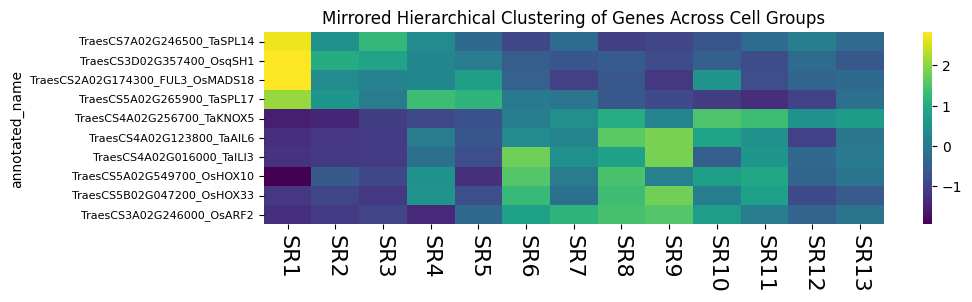

In [27]:
plt.figure(figsize=(10, 2.5))

# Define the categories in the desired order (cell groups)
categories = ['SR1', 'SR2', 'SR3', 'SR4', 'SR5', 'SR6', 'SR7', 'SR8', 'SR9', 
              'SR10', 'SR11', 'SR12', 'SR13']

# Define the genes to plot
genes_to_plot = ['TraesCS7A02G246500', #SPL14
                 'TraesCS3D02G357400', # RIL1
                 'TraesCS2A02G174300', #FUL3
                 'TraesCS5A02G265900', #SPL17
                 'TraesCS4A02G256700', #KNOX5
                 'TraesCS4A02G123800', #AIL6
                 'TraesCS4A02G016000', #ILI3 
                 'TraesCS5A02G549700', #HOX10/LF1
                 'TraesCS5B02G047200', #HOX33
                 'TraesCS3A02G246000' #ARF2
                ]


# Filter the DataFrame to select only the desired categories and genes
filtered_data = filtered_average_gene_expression_per_group.loc[categories, genes_to_plot]

# Transpose for heatmap format (genes on y-axis, cell groups on x-axis)
heatmap_data = filtered_data.T
heatmap_data_zscore = heatmap_data.apply(zscore, axis=1)

# Annotate data
heatmap_data_zscore_Annotated = pd.merge(heatmap_data_zscore, annotation, left_index=True, right_index=True, how='left')
heatmap_data_zscore_Annotated.set_index('annotated_name', inplace=True)


# Plot using the reordered data
ax = sns.heatmap(heatmap_data_zscore_Annotated, cmap='viridis', linewidths=0.0)
plt.title('Mirrored Hierarchical Clustering of Genes Across Cell Groups')

# Set the row label font size
ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)  # Adjust fontsize as needed
ax.set_xticklabels(ax.get_xticklabels(), rotation=270, ha='center', fontsize=10)  # Increase fontsize as needed

plt.tick_params(axis='x', labelsize=16)


plt.savefig('spikeletridge_leafridge_analysis/figures/VGN1e1_SR_gradients.svg', dpi=700, bbox_inches='tight', format='svg', transparent=True)
plt.show()


Correlation between ridge position and PC1: r = 0.676, p = 1.1225e-02


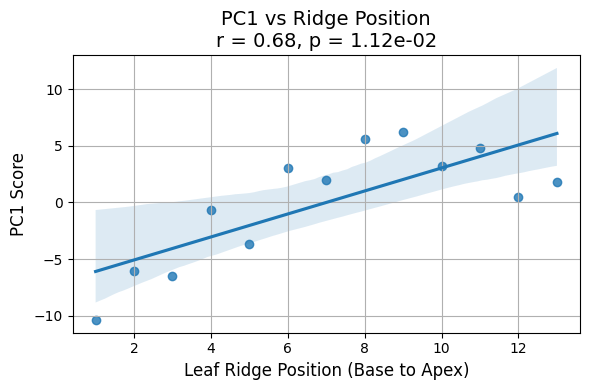

In [28]:
# Step 1: Reset index to move 'Custom cell groups' into a column
pca_df = pca_df.reset_index()

# Step 2: Extract the numeric ridge number from values like 'LR1', 'LR2', etc.
pca_df['ridge_position'] = pca_df['Custom cell groups'].str.extract(r'SR(\d+)').astype(float)


# Compute Spearman correlation between ridge position and PC1
corr_coef, p_value = spearmanr(pca_df['ridge_position'], pca_df['PC1'])

print(f"Correlation between ridge position and PC1: r = {corr_coef:.3f}, p = {p_value:.4e}")


plt.figure(figsize=(6, 4))
sns.regplot(x='ridge_position', y='PC1', data=pca_df)
plt.xlabel('Leaf Ridge Position (Base to Apex)', fontsize=12)
plt.ylabel('PC1 Score', fontsize=12)
plt.title(f'PC1 vs Ridge Position\nr = {corr_coef:.2f}, p = {p_value:.2e}', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()

## Generating a summary file of correlations to PC1 for both leaf ridges and spikelet ridges 

I want to make a file that summarises 

(Supplementary Table 16) 

In [29]:
merged_loadings = loadings_SR.merge(loadings_LR, on='gene_id', how='outer')
merged_loadings.to_csv("spikeletridge_leafridge_analysis/PC1_loading_scores_SRLRgroups.csv", index=True)
merged_loadings

,gene_id,PC1_loading_SR,PC2_loading_SR,PC1_loading_LR,PC2_loading_LR
0,TraesCS1A02G052000,-0.062186,-0.137673,0.073498,-0.010778
1,TraesCS1A02G199600,-0.108999,0.027328,-0.137848,0.104095
2,TraesCS1A02G241400,-0.147833,-0.120862,-0.045803,0.258094
3,TraesCS1A02G306300,0.079277,0.195485,0.071030,0.010062
4,TraesCS1A02G418200,-0.024034,0.097444,-0.124210,0.117340
...,...,...,...,...,...
82,TraesCS7A02G341800,0.061018,0.076588,-0.013824,0.177435
83,TraesCS7B02G413800,-0.105331,0.083259,0.030502,0.112508
84,TraesCS7D02G191600,-0.139192,-0.027209,-0.143668,0.082362
85,TraesCS7D02G246100,0.150744,0.049041,-0.097424,-0.141154


## set functions for plotting transcripts & segmentation on rotated & cropped images 

In [30]:
def get_transcripts_and_segmentation(
    adata_spatial,
    sample_name,
    segmentation_path,
    transcripts_path
):
    # Filter AnnData object by sample
    adata_sample = adata_spatial[adata_spatial.obs['dataset'] == sample_name].copy()
    adata_sample.obs.index = [index.split('-')[0] for index in adata_sample.obs.index]
    
    # Prepare cell IDs and cluster info
    cell_ids = adata_sample.obs.index.astype(str).str.strip().tolist()
    cluster_df = adata_sample.obs[['clusters']].copy()
    cluster_df.index = cluster_df.index.astype(str)

    # Load and filter segmentation data
    segmentation_df = gpd.read_parquet(segmentation_path)
    segmentation_df['EntityID'] = segmentation_df['EntityID'].astype(str)
    filtered_segmentation_df = segmentation_df[segmentation_df['EntityID'].isin(cell_ids)]
    
    # Merge with cluster info
    merged_segmentation_df = filtered_segmentation_df.merge(cluster_df, left_on='EntityID', right_index=True)

    # Load and convert transcripts to GeoDataFrame
    transcripts_df = pd.read_csv(transcripts_path)
    transcripts_gdf = gpd.GeoDataFrame(
        transcripts_df,
        geometry=gpd.points_from_xy(transcripts_df['global_x'], transcripts_df['global_y'])
    )

    # Ensure segmentation is a GeoDataFrame
    filtered_segmentation_gdf = gpd.GeoDataFrame(filtered_segmentation_df, geometry='Geometry')

    # Spatial join: keep only transcripts within segmentation geometries
    filtered_transcripts_gdf = gpd.sjoin(
        transcripts_gdf,
        filtered_segmentation_gdf[['EntityID', 'Geometry']],
        how='inner',
        predicate='within'
    )

    # Clean up transcript results
    filtered_transcripts_df = (
        filtered_transcripts_gdf
        .drop(columns=['index_right', 'Unnamed: 0'], errors='ignore')
        .drop_duplicates()
        .reset_index(drop=True)
    )

    return filtered_transcripts_df, merged_segmentation_df


In [31]:
def get_segmentation_bounds(segmentation_gdf):
    min_x, min_y = float('inf'), float('inf')
    max_x, max_y = float('-inf'), float('-inf')

    for _, row in segmentation_gdf.iterrows():
        shape = row['Geometry']
        if isinstance(shape, (Polygon, MultiPolygon)):
            bounds = shape.bounds  # (minx, miny, maxx, maxy)
            min_x = min(min_x, bounds[0])
            min_y = min(min_y, bounds[1])
            max_x = max(max_x, bounds[2])
            max_y = max(max_y, bounds[3])

    return round(min_x), round(min_y), round(max_x), round(max_y)


In [32]:
import numpy as np
import pandas as pd
import tifffile
from skimage.transform import AffineTransform, warp
from skimage import exposure
from numpy.linalg import inv

def load_and_transform_stain(
    image_path,
    transform_csv_path,
    segmentation_df,
    gamma=1.0,
    CLAHE=0.01,
    apply_gamma=True,
    apply_CLAHE=True
):
    # Step 1: Load image and transform matrix
    img = tifffile.imread(image_path)
    raw_matrix = pd.read_csv(transform_csv_path, header=None).squeeze()
    transform_matrix = np.array([list(map(float, row.strip().split())) for row in raw_matrix])
    inverted_matrix = inv(transform_matrix)

    # Step 2: Compute bounds from segmentation
    min_x, min_y, max_x, max_y = segmentation_df.total_bounds
    output_height = int(round(max_y - min_y))
    output_width = int(round(max_x - min_x))
    output_shape = (output_height, output_width)

    # Step 3: Build combined affine transform (inverse + shift to (0,0))
    shift_transform = np.array([
        [1, 0, -min_x],
        [0, 1, -min_y],
        [0, 0, 1]
    ])
    combined_transform = shift_transform @ inverted_matrix
    affine_transform = AffineTransform(matrix=combined_transform)

    # Step 4: Warp the image to micron space
    warped_img = warp(
        img,
        inverse_map=affine_transform.inverse,
        output_shape=output_shape,
        preserve_range=True
    )

    # Step 5: Normalize
    normalized_img = warped_img / warped_img.max()

    # Optional CLAHE
    if apply_CLAHE:
        processed_img = exposure.equalize_adapthist(normalized_img, clip_limit=CLAHE)
    else:
        processed_img = normalized_img

    # Optional gamma correction
    if apply_gamma:
        processed_img = processed_img ** gamma  # or use exposure.adjust_gamma

    # Convert to blue RGB
    rgb_img = np.zeros((*processed_img.shape, 3))
    rgb_img[..., 2] = processed_img  # Blue channel

    # Step 6: Return image and extent
    extent = [min_x, max_x, min_y, max_y]
    return rgb_img, extent, warped_img


In [33]:
filtered_transcripts_df, merged_segmentation_df = get_transcripts_and_segmentation(
    adata_spatial=adata_spatial,
    sample_name='VGN1e1',
    segmentation_path='cell_segmentation/VGN1e_region1_output/cellpose2_micron_space_VGN1e1.parquet',
    transcripts_path='cell_segmentation/VGN1e_region1_output/detected_transcripts_VGN1e1.csv'
)

min_x, min_y, max_x, max_y = get_segmentation_bounds(merged_segmentation_df)

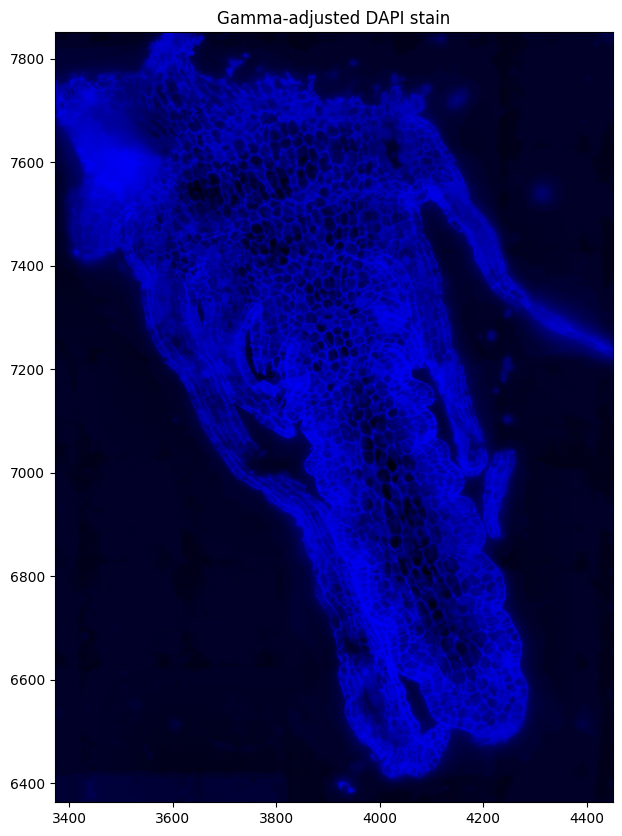

In [34]:
rgb_img, extent, warped_img = load_and_transform_stain(
    image_path='cell_segmentation/VGN1e_region1_output/images/mosaic_DAPI_z3.tif',
    transform_csv_path='cell_segmentation/VGN1e_region1_output/images/micron_to_mosaic_pixel_transform.csv',
    segmentation_df=merged_segmentation_df,
    apply_gamma=True,  
    apply_CLAHE = True, 
    gamma = 0.55,
    CLAHE = 0.02
)

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(rgb_img, extent=extent, origin='upper')
ax.set_title("Gamma-adjusted DAPI stain")
plt.show()

In [35]:
def rotate_image_and_plot_clusters(
    rgb_img,
    segmentation_df,
    angle,
    custom_cluster_colors,
    edge_color,
    default_edge_color,
    scale_bar_length,
    scale_bar_x_start,
    scale_bar_y_start,
    save_path=None,
    save_figure=False,
    dpi=500,
    show_axis_ticks=True,
    linewidth=0.3,
    xlim=None,
    ylim=None
):
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    from matplotlib.collections import PatchCollection
    from shapely.geometry import Polygon, MultiPolygon
    from scipy.ndimage import rotate

    # Step 1: Compute bounds and center
    min_x, min_y, max_x, max_y = segmentation_df.total_bounds
    height, width = rgb_img.shape[:2]
    pixel_size_x = (max_x - min_x) / width
    pixel_size_y = (max_y - min_y) / height
    center_x = (min_x + max_x) / 2
    center_y = (min_y + max_y) / 2

    # Step 2: Rotate the image
    rotated_rgb_img = rotate(
        rgb_img,
        angle=angle,
        axes=(1, 0),
        reshape=True,
        order=1,
        mode='constant',
        cval=0
    )
    new_height, new_width = rotated_rgb_img.shape[:2]
    extent = [
        center_x - (new_width / 2) * pixel_size_x,
        center_x + (new_width / 2) * pixel_size_x,
        center_y - (new_height / 2) * pixel_size_y,
        center_y + (new_height / 2) * pixel_size_y
    ]
    if xlim is None:
        xlim = (extent[0], extent[1])
    if ylim is None:
        ylim = (extent[2], extent[3])

    # Step 3: Rotate segmentation
    radians = np.radians(angle)
    rotation_matrix = np.array([
        [np.cos(radians), -np.sin(radians)],
        [np.sin(radians),  np.cos(radians)]
    ])

    rotated_patches_list = []
    for _, row in segmentation_df.iterrows():
        shape = row['Geometry']
        cluster = str(row.get('clusters', 'NA'))
        fill_color = custom_cluster_colors.get(cluster, default_edge_color)
        patch_edge_color = edge_color if fill_color != default_edge_color else '#FF000000'
    
        polys = shape.geoms if isinstance(shape, MultiPolygon) else [shape]
        for poly in polys:
            coords = np.array(poly.exterior.coords)
            centered_coords = coords - [center_x, center_y]
            rotated_coords = np.dot(centered_coords, rotation_matrix) + [center_x, center_y]
            patch = patches.Polygon(
                rotated_coords,
                closed=True,
                facecolor=fill_color,
                edgecolor=patch_edge_color,
                linewidth=linewidth
            )
            rotated_patches_list.append(patch)

    # Step 4: Plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(rotated_rgb_img, origin='lower', extent=extent)
    ax.add_collection(PatchCollection(rotated_patches_list, match_original=True))

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_aspect('equal')

    if not show_axis_ticks:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])

    ax.hlines(
        scale_bar_y_start,
        scale_bar_x_start,
        scale_bar_x_start + scale_bar_length,
        colors='white',
        linewidth=3
    )

    plt.tight_layout()
    if save_figure and save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight', format='png', transparent=True)
    plt.show()

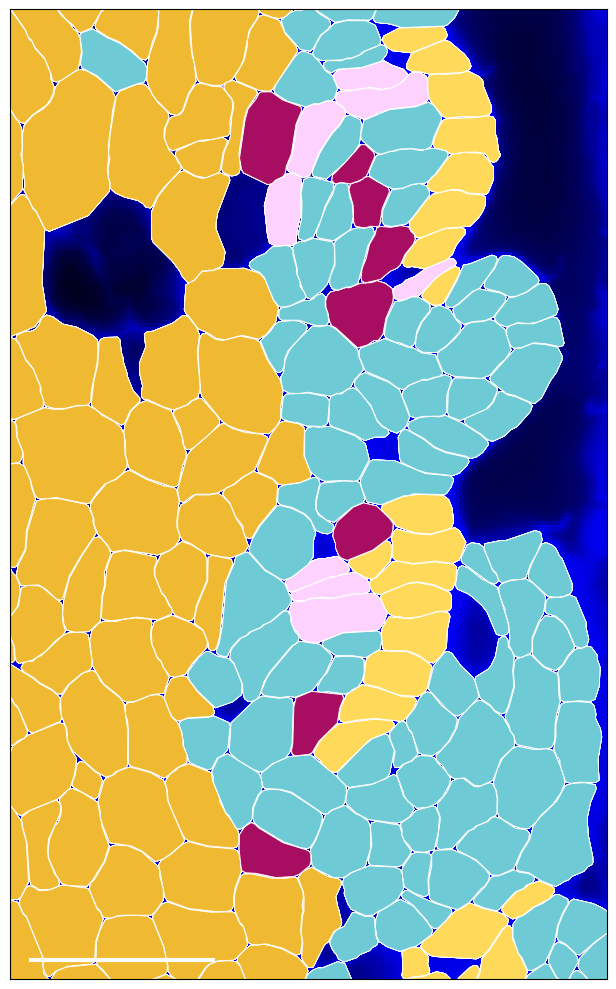

In [36]:
rotate_image_and_plot_clusters(
    segmentation_df=merged_segmentation_df,
    custom_cluster_colors={
        '0': '#a70e62', 
        '12': '#6ecad5',
        '3': '#f0b932'  ,
        '4': '#ffd95a',
        '11': '#fed2ff',
    },
    rgb_img=rgb_img,
    angle=-22,
    xlim=(3960, 4120),
    ylim=(6960, 7220),
    scale_bar_length=50,
    scale_bar_x_start=3965,
    scale_bar_y_start=6965,
    edge_color='white',
    default_edge_color='#FF000000',
    save_figure=True,
    save_path='spikeletridge_leafridge_analysis/figures/VGN1e1_apical_domainmap_wstain_50umscale.png',
    dpi=500,
    show_axis_ticks=False, 
    linewidth=0.6
)


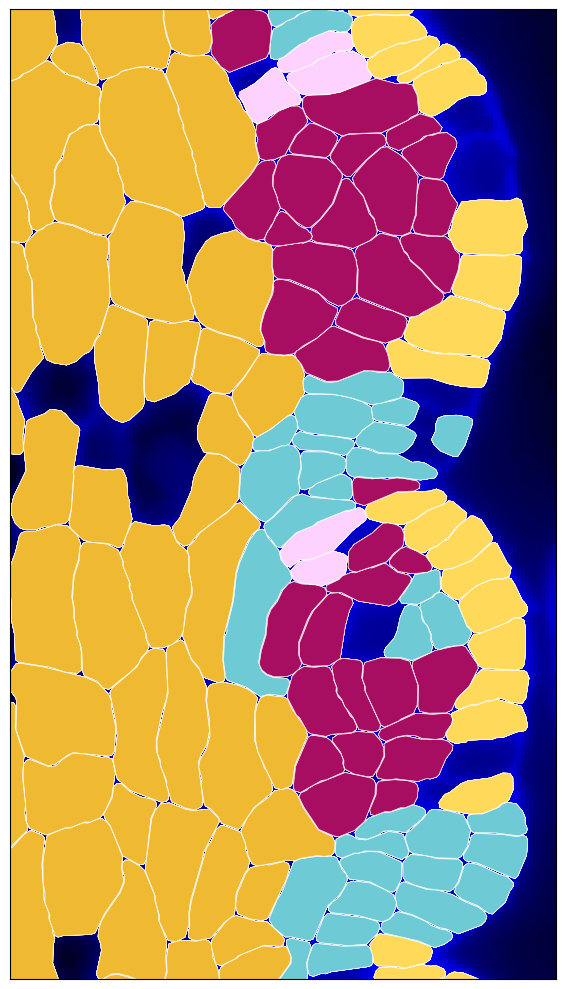

In [37]:
rotate_image_and_plot_clusters(
    segmentation_df=merged_segmentation_df,
    custom_cluster_colors={
        '0': '#a70e62', 
        '12': '#6ecad5',
        '9': '#7A58C7', 
        '3': '#f0b932'  ,
        '4': '#ffd95a',
        '11': '#fed2ff',
    },
    rgb_img=rgb_img,
    angle=-22,
    xlim=(3970, 4105),
    ylim=(7330, 7570),
    scale_bar_length=50,
    scale_bar_x_start=3965,
    scale_bar_y_start=7320,
    edge_color='white',
    default_edge_color='#FF000000',
    save_figure=True,
    save_path='spikeletridge_leafridge_analysis/figures/VGN1e1_central_domainmap_50scalebar_wstain.png',
    dpi=500,
    show_axis_ticks=False, 
    linewidth=0.4
)


In [38]:
def rotate_image_and_transcripts_only(
    warped_img,  # grayscale TIFF already in micron space
    segmentation_df,
    transcripts_df,
    genes_of_interest,
    angle,
    scale_bar_length,
    scale_bar_x_start,
    scale_bar_y_start,
    edge_color,
    face_color,
    show_axis_ticks,
    linewidth,
    pointsize,
    rgb_img,
    save_path=None,
    save_figure=False,
    dpi = 500,
    xlim=None,
    ylim=None,

):


    # Step 2: Get original image bounds and pixel size
    min_x, min_y, max_x, max_y = segmentation_df.total_bounds
    height, width = rgb_img.shape[:2]
    pixel_size_x = (max_x - min_x) / width
    pixel_size_y = (max_y - min_y) / height
    center_x = (min_x + max_x) / 2
    center_y = (min_y + max_y) / 2

    # Step 3: Rotate the RGB image using scipy.ndimage.rotate
    rotated_rgb_img = rotate(
        rgb_img,
        angle=angle,
        axes=(1, 0),
        reshape=True,
        order=1,
        mode='constant',
        cval=0
    )

    new_height, new_width = rotated_rgb_img.shape[:2]

    # Step 4: Compute new extent
    default_extent = [
        center_x - (new_width / 2) * pixel_size_x,
        center_x + (new_width / 2) * pixel_size_x,
        center_y - (new_height / 2) * pixel_size_y,
        center_y + (new_height / 2) * pixel_size_y
    ]
    image_extent = default_extent
    if xlim is None:
        xlim = (image_extent[0], image_extent[1])
    if ylim is None:
        ylim = (image_extent[2], image_extent[3])

    # Step 5: Define rotation matrix
    radians = np.radians(angle)
    rotation_matrix = np.array([
        [np.cos(radians), -np.sin(radians)],
        [np.sin(radians),  np.cos(radians)]
    ])

    # Step 7: Rotate transcripts
    rotated_transcript_data = {}
    for gene, color in genes_of_interest.items():
        gene_df = transcripts_df[transcripts_df['gene'] == gene].copy()
        coords = gene_df[['global_x', 'global_y']].to_numpy()
        centered_coords = coords - [center_x, center_y]
        rotated_coords = np.dot(centered_coords, rotation_matrix) + [center_x, center_y]
        rotated_transcript_data[gene] = {
            'x': rotated_coords[:, 0],
            'y': rotated_coords[:, 1],
            'color': color
        }

    # Step 8: Plot everything
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(rotated_rgb_img, origin='lower', extent=image_extent)

    for gene, data in rotated_transcript_data.items():
        ax.scatter(data['x'], data['y'], color=data['color'], s=pointsize, alpha=1, label=gene)

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_aspect('equal')

    if not show_axis_ticks:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])

    ax.hlines(
        scale_bar_y_start,
        scale_bar_x_start,
        scale_bar_x_start + scale_bar_length,
        colors='white',
        linewidth=3
    )

    plt.tight_layout()
    if save_figure and save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight', format='png', transparent=True)
    plt.show()


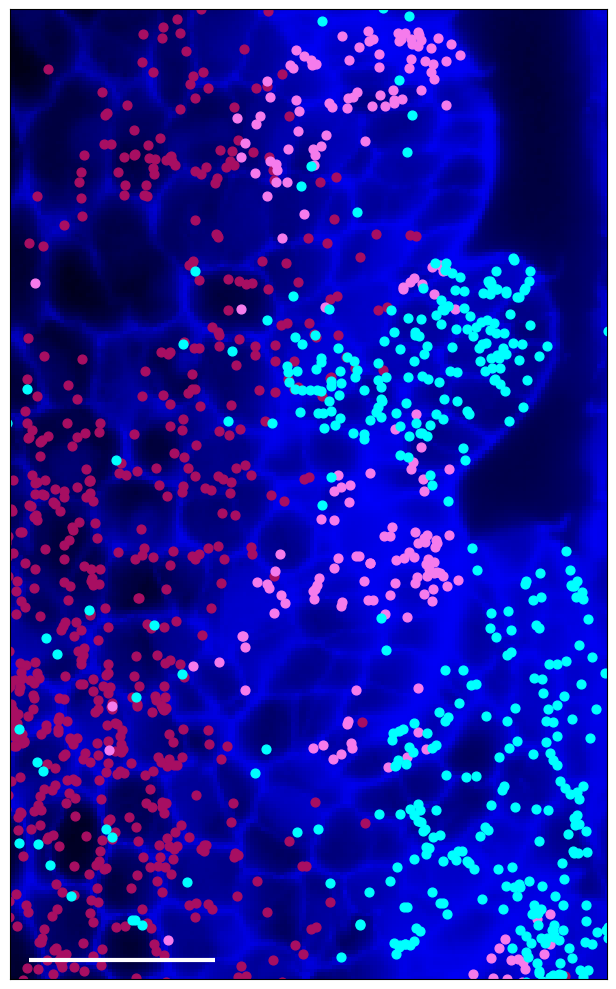

In [39]:
rotate_image_and_transcripts_only(
    warped_img=warped_img,
    segmentation_df=merged_segmentation_df,
    transcripts_df=filtered_transcripts_df,
    genes_of_interest={'TraesCS4A02G256700': '#a70e62', #KNOx
                      'TraesCS7D02G246100': '#F57BEC', #CUC3
                       'TraesCS1A02G418200': 'cyan' # NL1
},
    angle=-22,
    rgb_img = rgb_img,
    xlim=(3960, 4120),
    ylim=(6960, 7220),
    scale_bar_length=50,
    scale_bar_x_start=3965,
    scale_bar_y_start=6965,
    edge_color='white',
    face_color='none',
    save_figure = True,
    save_path='spikeletridge_leafridge_analysis/figures/VGN1e1_basal_KNOX5_NL1_CUC3_wstain_50umscale.png',
    dpi=500,
    show_axis_ticks=False,
    linewidth=0.3,
    pointsize=40,
)

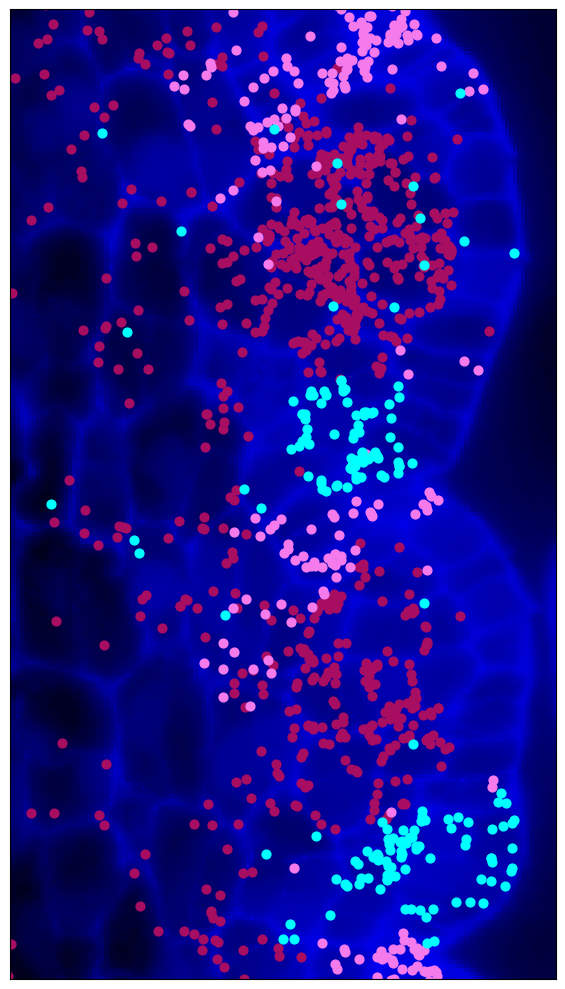

In [40]:
rotate_image_and_transcripts_only(
    warped_img=warped_img,
    segmentation_df=merged_segmentation_df,
    transcripts_df=filtered_transcripts_df,
    genes_of_interest={'TraesCS4A02G256700': '#a70e62', #KNOx
                      'TraesCS7D02G246100': '#F57BEC', #CUC3
                       'TraesCS1A02G418200': 'cyan' # NL1
},
    angle=-22,
    rgb_img = rgb_img,
    xlim=(3970, 4105),
    ylim=(7330, 7570),
    scale_bar_length=50,
    scale_bar_x_start=3965,
    scale_bar_y_start=7320,
    edge_color='white',
    face_color='none',
    save_figure = True,
    save_path='spikeletridge_leafridge_analysis/figures/VGN1e1_apical_KNOX5_wstain_50umscale.png',
    dpi=500,
    show_axis_ticks=False,
    linewidth=0.3,
    pointsize=40,
)

# Creating maps of LR + SR, gene expression 

In [41]:
def rotate_image_with_transcripts_and_segmentations_highlighted_fill(
    rgb_img,
    segmentation_df,
    transcripts_df,
    genes_of_interest,
    angle,
    custom_cluster_colors,
    edge_color,
    default_edge_color,
    scale_bar_length,
    scale_bar_x_start,
    scale_bar_y_start,
    LeafRidge,
    SpikeletRidge,
    show_axis_ticks=True,
    linewidth=0.3,
    pointsize=1,
    save_path=None,
    save_figure=False,
    dpi=500,
    xlim=None,
    ylim=None,
    alpha = 0.5
):

    min_x, min_y, max_x, max_y = segmentation_df.total_bounds
    height, width = rgb_img.shape[:2]
    pixel_size_x = (max_x - min_x) / width
    pixel_size_y = (max_y - min_y) / height
    center_x = (min_x + max_x) / 2
    center_y = (min_y + max_y) / 2

    rotated_rgb_img = rotate(
        rgb_img,
        angle=angle,
        axes=(1, 0),
        reshape=True,
        order=1,
        mode='constant',
        cval=0
    )
    new_height, new_width = rotated_rgb_img.shape[:2]
    extent = [
        center_x - (new_width / 2) * pixel_size_x,
        center_x + (new_width / 2) * pixel_size_x,
        center_y - (new_height / 2) * pixel_size_y,
        center_y + (new_height / 2) * pixel_size_y
    ]
    if xlim is None:
        xlim = (extent[0], extent[1])
    if ylim is None:
        ylim = (extent[2], extent[3])

    radians = np.radians(angle)
    rotation_matrix = np.array([
        [np.cos(radians), -np.sin(radians)],
        [np.sin(radians),  np.cos(radians)]
    ])

    rotated_patches_list = []
    for _, row in segmentation_df.iterrows():
        shape = row['Geometry']
        cluster = str(row.get('clusters', 'NA'))
        entity_id = row.get('EntityID')
        fill_color = custom_cluster_colors.get(cluster, default_edge_color)

        # Determine fill color
        if entity_id in LeafRidge:
            fill_color = '#1E88E5'
        elif entity_id in SpikeletRidge:
            fill_color = '#D81B60'
        else:
            fill_color = custom_cluster_colors.get(cluster, default_edge_color)
        
        patch_edge_color = 'none'  # all edges transparent


        polys = shape.geoms if isinstance(shape, MultiPolygon) else [shape]
        for poly in polys:
            coords = np.array(poly.exterior.coords)
            centered_coords = coords - [center_x, center_y]
            rotated_coords = np.dot(centered_coords, rotation_matrix) + [center_x, center_y]
            patch = patches.Polygon(
                rotated_coords,
                closed=True,
                facecolor=fill_color,
                edgecolor=patch_edge_color,
                linewidth=linewidth,
                alpha = alpha
            )
            rotated_patches_list.append(patch)

    # Rotate transcript coordinates
    rotated_transcript_data = {}
    for gene, color in genes_of_interest.items():
        gene_df = transcripts_df[transcripts_df['gene'] == gene].copy()
        coords = gene_df[['global_x', 'global_y']].to_numpy()
        centered_coords = coords - [center_x, center_y]
        rotated_coords = np.dot(centered_coords, rotation_matrix) + [center_x, center_y]
        rotated_transcript_data[gene] = {
            'x': rotated_coords[:, 0],
            'y': rotated_coords[:, 1],
            'color': color
        }

    # Plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(rotated_rgb_img, origin='lower', extent=extent)
    ax.add_collection(PatchCollection(rotated_patches_list, match_original=True))

    for gene, data in rotated_transcript_data.items():
        ax.scatter(data['x'], data['y'], color=data['color'], s=pointsize, alpha=1, label=gene)

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_aspect('equal')

    if not show_axis_ticks:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])

    ax.hlines(
        scale_bar_y_start,
        scale_bar_x_start,
        scale_bar_x_start + scale_bar_length,
        colors='white',
        linewidth=3
    )

    plt.tight_layout()
    if save_figure and save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight', format='png', transparent=True)
    plt.show()


### reading in SR and LR groups so I can highlight them in plot 

In [42]:
# I am reading in cell groups. I selected Leaf ridges (LRs) and spikelet ridges (SRs) and numbered them 1-13
#I performed the groupings in MERSCOPE Visualiser tool and exported to a .csv file 
cellgroups = pd.read_csv('spikeletridge_leafridge_analysis/cell_lists/VGN1e_region1_cell_categories.csv', header=0, index_col=0)
cellgroups = cellgroups[['Custom cell groups']].copy()

# Assuming 'cellgroups' has the column 'Custom cell groups' and the index is EntityID
LeafRidge = cellgroups[cellgroups['Custom cell groups'].str.startswith('LR')].index.tolist()
SpikeletRidge = cellgroups[cellgroups['Custom cell groups'].str.startswith('SR')].index.tolist()
LeafRidge = [str(eid) for eid in LeafRidge]
SpikeletRidge = [str(eid) for eid in SpikeletRidge]

## picking new brightness levels for stain

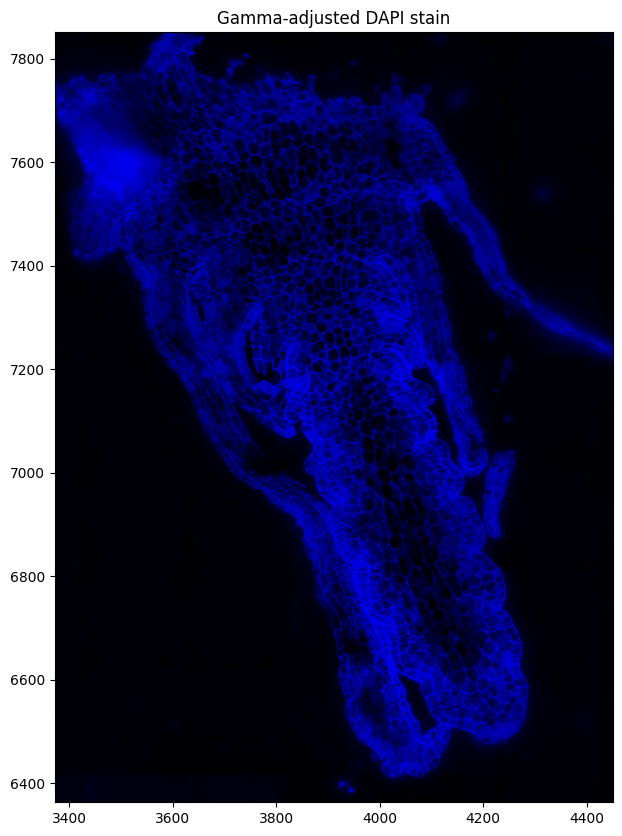

In [43]:
rgb_img, extent, warped_img = load_and_transform_stain(
    image_path='cell_segmentation/VGN1e_region1_output/images/mosaic_DAPI_z3.tif',
    transform_csv_path='cell_segmentation/VGN1e_region1_output/images/micron_to_mosaic_pixel_transform.csv',
    segmentation_df=merged_segmentation_df,
    gamma=1,  # (<1 brightens, >1 darkens)
    CLAHE = 0.02 # 0.01 = default
)

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(rgb_img, extent=extent, origin='upper')
ax.set_title("Gamma-adjusted DAPI stain")
plt.show()

### making plots that highlight each SR and LR, and color them in 

Processing TraesCS4A02G256700 (KNOX5)...


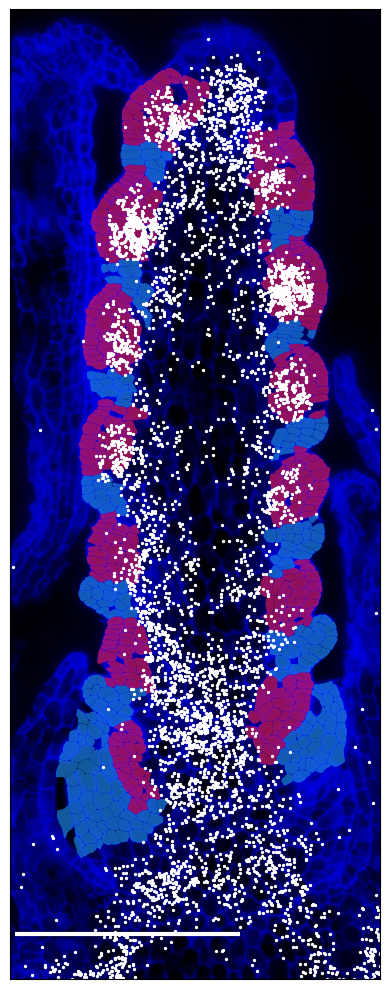

Processing TraesCS4A02G123800 (AIL6)...


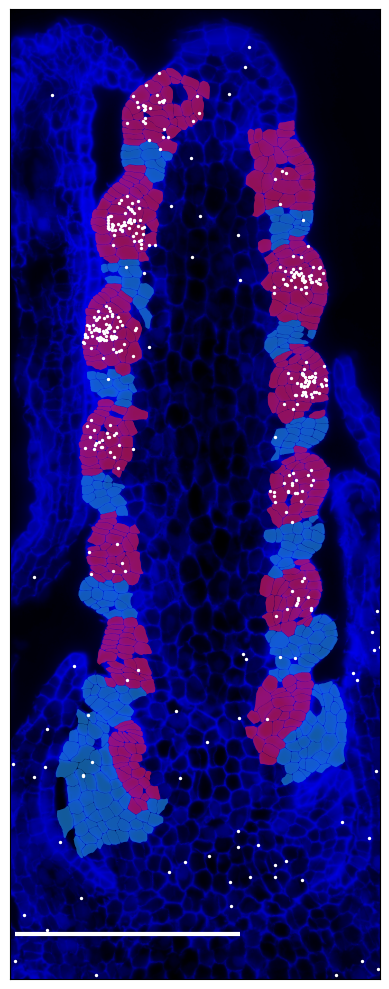

Processing TraesCS4A02G016000 (ILI3)...


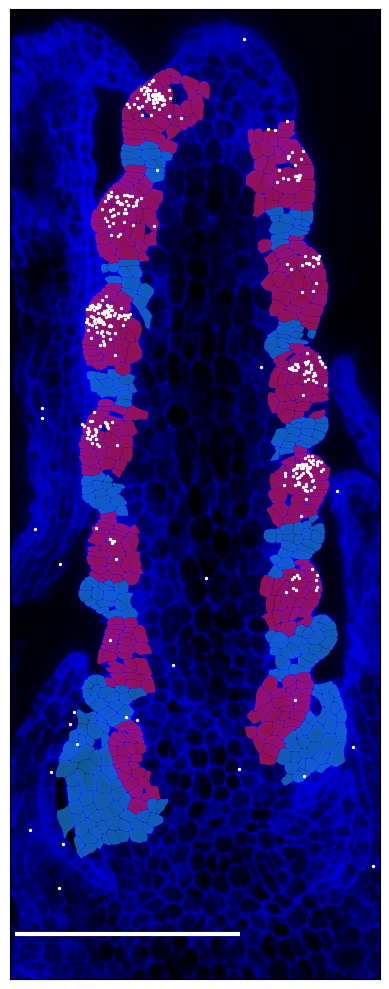

Processing TraesCS5A02G549700 (LF1)...


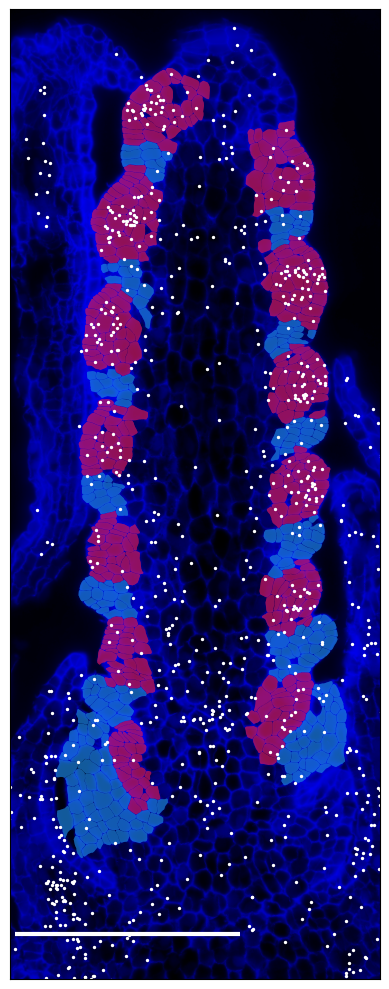

Processing TraesCS5B02G047200 (HOX33)...


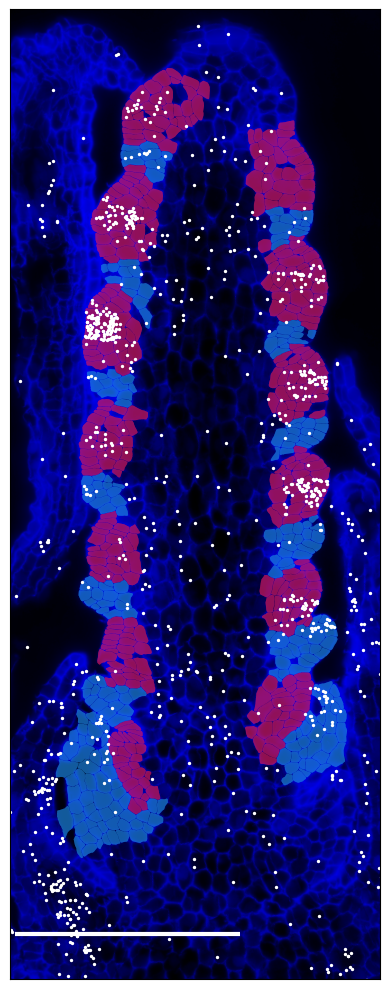

Processing TraesCS5A02G207300 (REP1)...


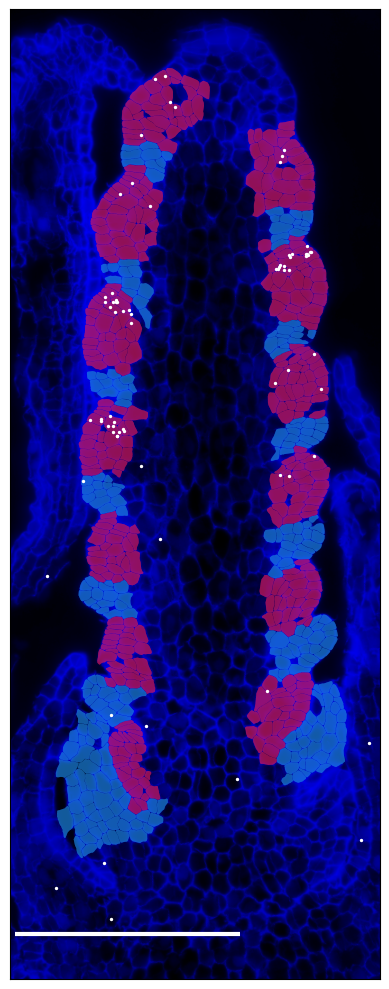

Processing TraesCS7A02G246500 (SPL14)...


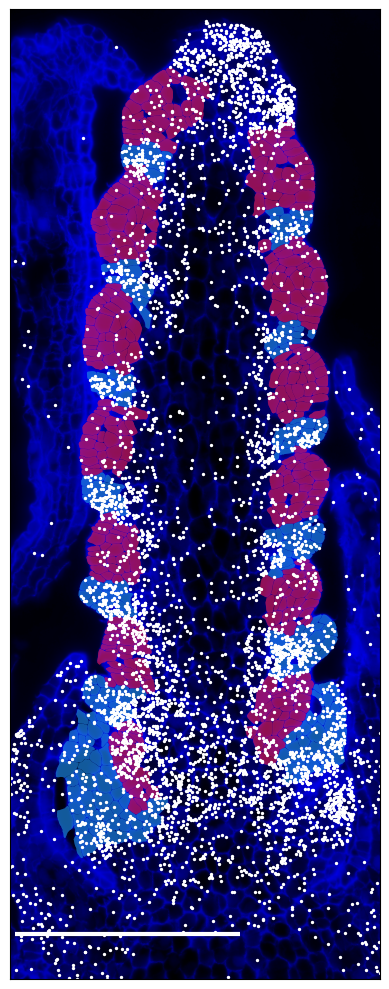

Processing TraesCS5A02G265900 (SPL17)...


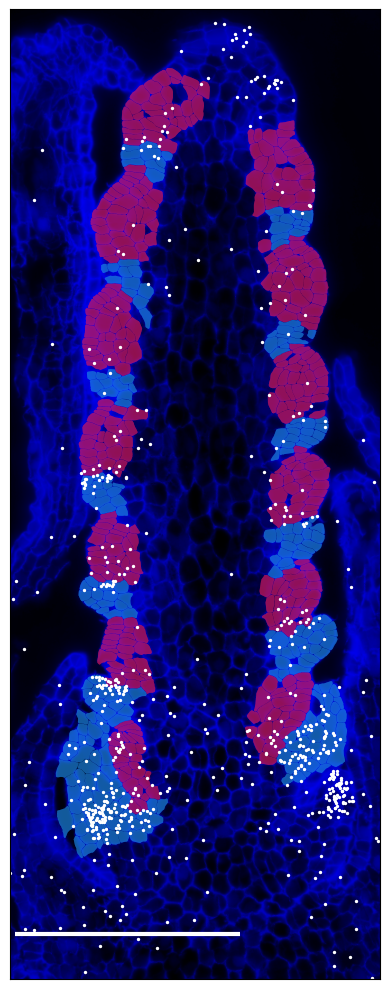

Processing TraesCS2A02G174300 (FUL3)...


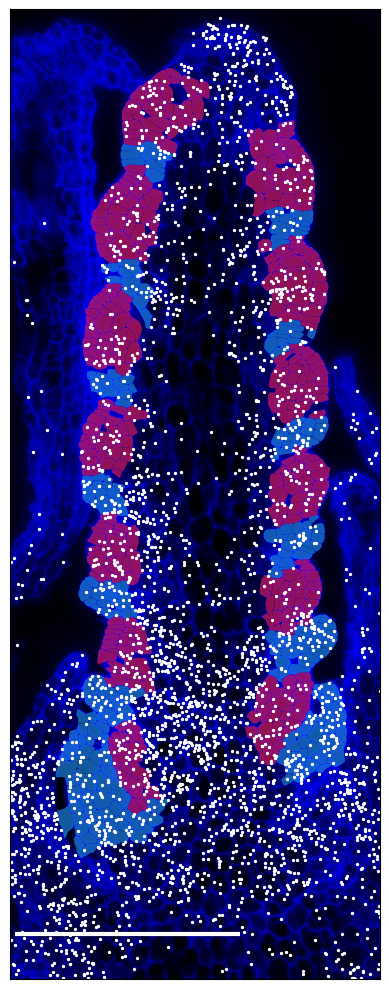

Processing TraesCS6A02G287300 (LEC1)...


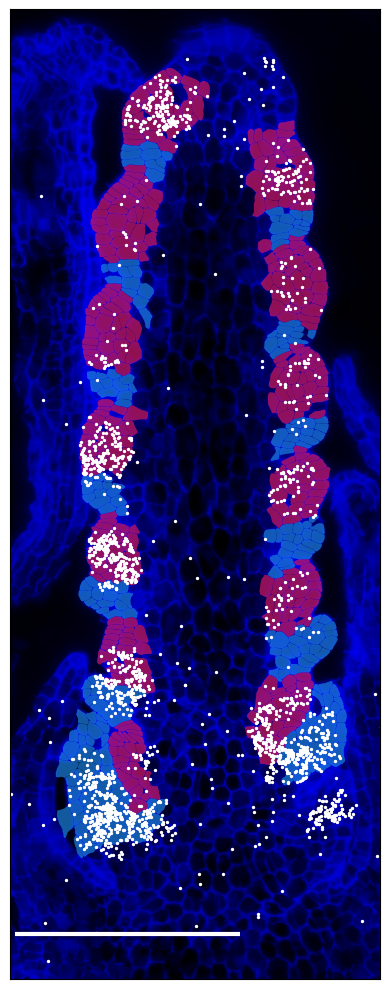

Processing TraesCS5A02G473800 (AP2-5)...


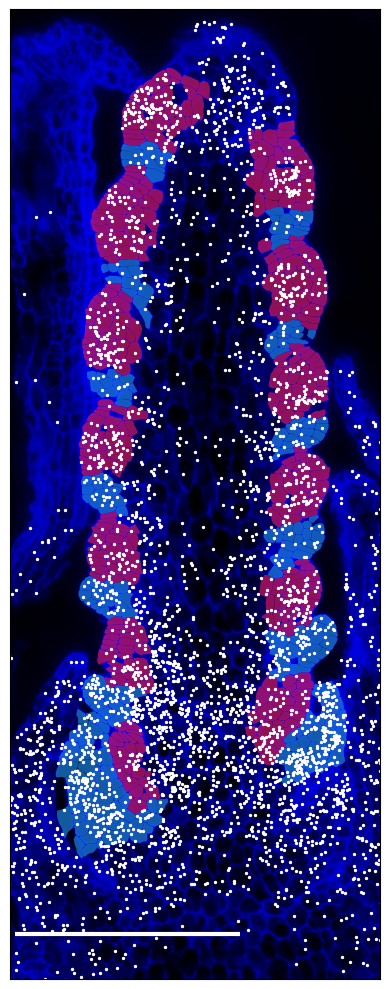

Processing TraesCS3D02G357400 (RIL1)...


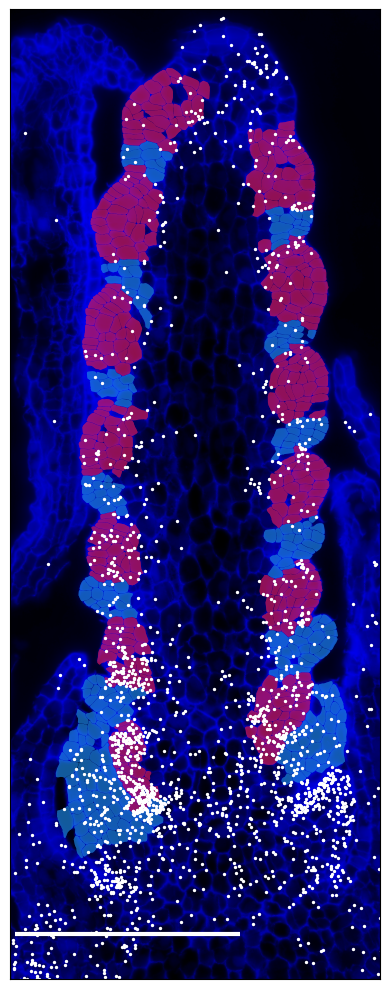

Processing TraesCS3D02G284200 (AGL14)...


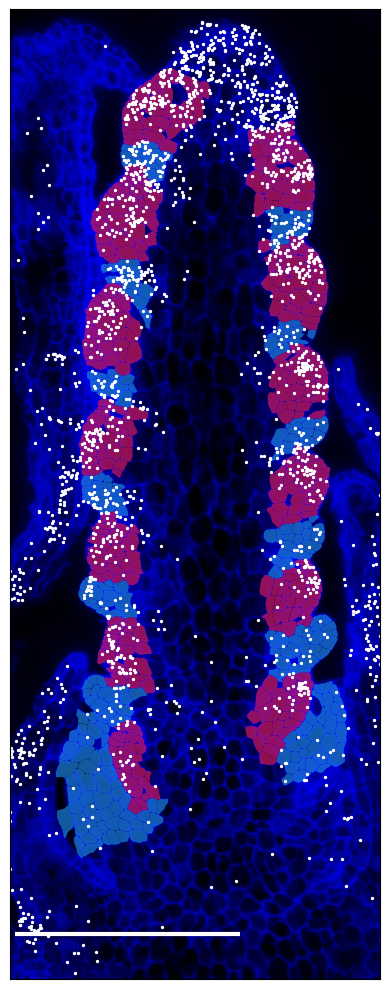

Processing TraesCS5A02G401800 (SP3)...


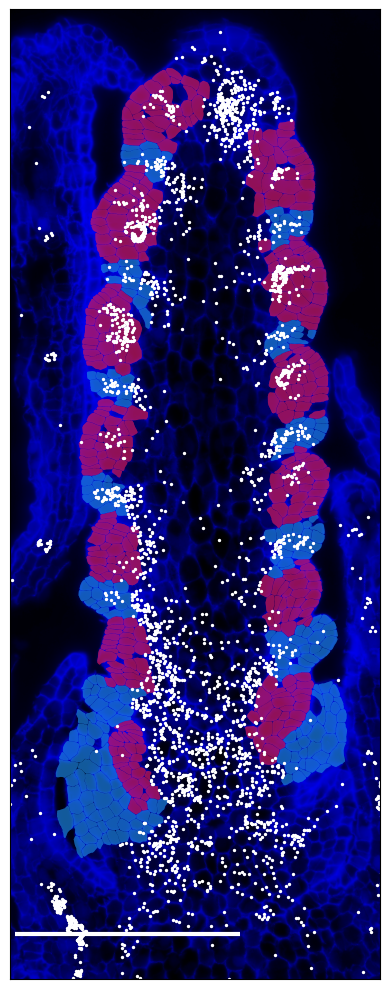

Processing TraesCS2B02G464200 (LFY2)...


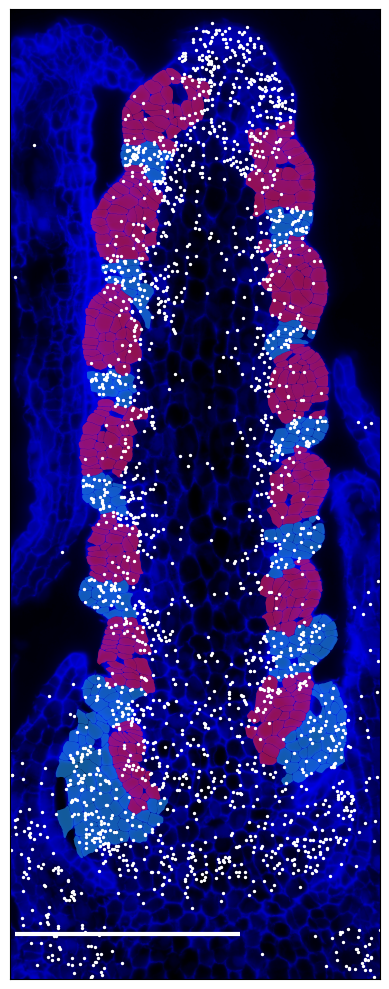

In [45]:
## loop through a list of genes 
# Example input

genes_to_plot = [
    ('TraesCS4A02G256700', 'KNOX5'),
    ('TraesCS4A02G123800', 'AIL6'),
    ('TraesCS4A02G016000', 'ILI3'),
    ('TraesCS5A02G549700', 'LF1'),
    ('TraesCS5B02G047200', 'HOX33'),
    ('TraesCS5A02G207300', 'REP1'),
    ('TraesCS7A02G246500', 'SPL14'),
    ('TraesCS5A02G265900', 'SPL17'),
    ('TraesCS2A02G174300', 'FUL3'),
    ('TraesCS6A02G287300', 'LEC1'),
    ('TraesCS5A02G473800', 'AP2-5'),
    ('TraesCS3D02G357400', 'RIL1'),
    ('TraesCS3D02G284200', 'AGL14'),
    ('TraesCS5A02G401800', 'SP3'),
    ('TraesCS2B02G464200', 'LFY2'),
]

# Loop through each gene and generate plots
for gene_id, display_name in genes_to_plot:
    print(f"Processing {gene_id} ({display_name})...")

    # Call the plotting function
    rotate_image_with_transcripts_and_segmentations_highlighted_fill(
        rgb_img=rgb_img,
        segmentation_df=merged_segmentation_df,
        transcripts_df=filtered_transcripts_df,
        genes_of_interest={gene_id: 'white'},
        angle=-22,
        custom_cluster_colors={
            '0': 'none', 
            '12': 'none',
            '9': 'none', 
            '3': 'none'  
        },
        edge_color='white',
        default_edge_color='none',
        scale_bar_length=250,
        scale_bar_x_start=3750,
        scale_bar_y_start=6800,
        LeafRidge=LeafRidge,
        SpikeletRidge=SpikeletRidge,
        xlim=(3745, 4155),
        ylim=(6750, 7825),
        show_axis_ticks=False,
        linewidth=0.1,
        pointsize=2,
        alpha=0.15,
        save_figure=True,
        save_path=f'spikeletridge_leafridge_analysis/figures/VGN1e1_LRSRdomains_{display_name}_withstain_250scalebar.png'
    )
